In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.display import Audio
from ipywidgets import interactive

import numpy as np
import math

from scipy.io.wavfile import read

from utils import *

import warnings
warnings.filterwarnings('ignore')

# Índice


1. [SAQ](#saq)

2. [Código Morse](#morse)

3. [Ouvindo o SAQ](#osaq)

4. [Explorações](#exp)

5. [Links](#links)


# 1. SAQ
<a id="saq"></a>

O mais antigo transmissor de rádio, ainda em funcionamento, encontra-se localizado em Grimeton, na Suécia. Este emissor era usado para emissões de telegrafia transatlântica nas primeiras décadas do séc. XX.
É atualmente reconhecido como Património da Humanidade pela UNESCO e efetua emissões comemorativas regulares. Uma vez que utiliza uma frequência de $17.2 kHz$, é possivel receber, ouvir e descodificar as suas mensagens em código Morse.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/f/f9/Varberg_Radio_Station.jpg/640px-Varberg_Radio_Station.jpg" alt="Drawing"  style="width: 50%;"/>

[fonte](https://en.wikipedia.org/wiki/File:Varberg_Radio_Station.jpg)

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Grimeton_VLF_masts.jpg/640px-Grimeton_VLF_masts.jpg" alt="Drawing"  style="width: 50%;"/>

[fonte](https://commons.wikimedia.org/wiki/File:Grimeton_VLF_masts.jpg)

A sua construção data do período logo após a Primeira Guerra Mundial, por volta do ano 1922, impulsionada pelo corte dos cabos submarinos de telegrafia. 

Embora os cabos tenham sido reparados  depois da guerra e as comunicações reestabelecidas, a Suécia, tal como muitos outros países, continuava dependente de terceiros para comunicações de longa distância o que não era, a longo prazo, uma situação desejável. 

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/d/dc/Alexanderson_Alternator.jpg/640px-Alexanderson_Alternator.jpg" alt="Drawing"  style="width: 50%;"/>

Transmissor de Alexanderson da estação de Grimeton. [fonte](https://en.wikipedia.org/wiki/File:Alexanderson_Alternator.jpg)

A aldeia de Grimeton foi escolhida para a construção deste transmissor, pois os sinais chegavam a Nova Iorque sem muita atenuação, seguindo a curvatura da Terra entre dois condutores: a água marinha e a ionosfera.

In [2]:
NY = (41.0,-73.0)
SAQ = (57.113, 12.397)

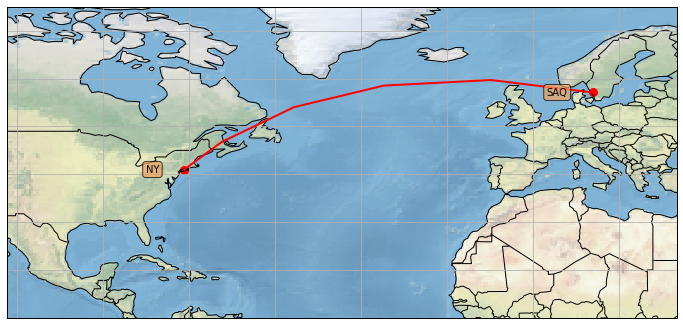

In [3]:
mapa_2pontos(SAQ, NY, nomes=['SAQ','NY'])

Mapa de Grimeton - Nova Iorque. Ao longo de $100km$ de costa na província de Halland, a sul de Gotenburgo, um grande círculo pode ser desenhado até Nova Iorque, praticamente sem tocar terra. Este facto é extremamente importante pois a absorção da radiação que passa sobre terra é consideravelmente maior do que a que passa sobre a água salina que é condutora de eletricidade. A antiga aldeia de Grimeton está situada a $10km$  da costa, evitando assim ataques pelos navios couraçados da época.

Relativamente a Viseu temos:

In [4]:
Viseu = (40.6582338,-7.9123233)
SAQ = (57.113, 12.397)

In [5]:
d = distancia(SAQ, Viseu)

A  distância entre os dois pontos é de 2337.66km


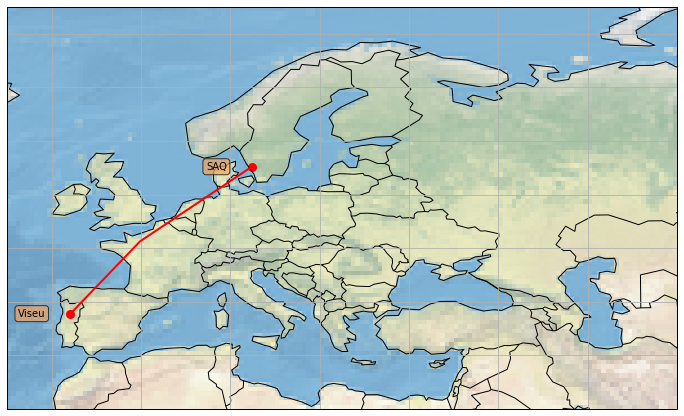

In [6]:
mapa_2pontos(SAQ, Viseu, nomes=['SAQ','Viseu'], limites = [-15,60,75,30])

Presentemente, a Fundação Património da Humanidade de Grimeton é proprietária e operadora da estação. Um centro de visitantes foi construído e visitas guiadas são organizadas regularmente durante o verão e em qualquer altura para grupos sob pedido. A associação Alexander foi criada para dar apoio a estas actividades, tendo membros por toda a Suécia bem como em outros países. 

Na sua página ([link](www.alexander.n.se)), é dada informação sobre eventos e assuntos relacionados. Três transmissões anuais têm sido realizadas:
* No dia Alexander, normalmente no domingo mais próximo de 1 de Julho, são realizadas duas transmissões. O público é convidado a observar as transmissões e a fazer visitas guiadas entre outras actividades.
* No dia das Nações Unidas a 24 de Outubro.
* Em todas as manhãs da véspera de Natal, sendo hoje em dia uma tradição popular. A origem desta tradição remonta à véspera de Natal de 1906 quando, para enorme surpresa dos operadores de rádio, Fessenden realizou uma transmissão com um dos seus alternadores, que este conseguiu modular para enviar uma mensagem com voz e música (com o próprio a tocar violino). Foi a primeira transmissão do género, comemorada 100 anos mais tarde com a transmissão de Grimeton. Desde então, uma mensagem de Natal é enviada todos os anos.

Para conseguirmos descodificar as mensagens do `SAQ`, vamos aprender um pouco sobre código Morse.

# 2. Código Morse

<a id="morse"></a>

Desenvolvido por [Samuel Morse](https://pt.wikipedia.org/wiki/Samuel_Morse) em 1835, o código com o seu nome - [Código Morse](https://pt.wikipedia.org/wiki/C%C3%B3digo_Morse) era utilizado nas comunicações por telegrafo e nos primeiros anos de comunicações rádio. 

O código consiste numa codificação dos carateres de texto usando pontos (*dot*) e traços (*dash*), como está ilustrado na figura seguinte: 

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b5/International_Morse_Code.svg/596px-International_Morse_Code.svg.png" alt="Drawing"  style="width: 45%;"/>

[fonte](https://commons.wikimedia.org/wiki/File:International_Morse_Code.svg)

Vamos começar por ouvir uma mensagem histórica, enviada pelo [Titanic](https://en.wikipedia.org/wiki/Sinking_of_the_RMS_Titanic) durante o seu naufrágio a 5 de abril de 1912.  

In [7]:
Audio('https://upload.wikimedia.org/wikipedia/commons/5/5e/RMS_Titanic_distress_signal_simulated_as_morse_code.wav') 

[fonte](https://en.wikipedia.org/wiki/File:RMS_Titanic_distress_signal_simulated_as_morse_code.wav)

Só mesmo um ouvido bem treinado consegue descodificar a mensagem anterior...

<img src="https://upload.wikimedia.org/wikipedia/commons/5/50/Titanic_signal.jpg" alt="Drawing"  style="width: 45%;"/>

[fonte](https://en.wikipedia.org/wiki/File:Titanic_signal.jpg)

O melhor é começar com um exemplo, numa velocidade mais lenta, de algumas letras em Morse. 

Ex: Ouça algumas vezes o seguinte ficheiro, tentando apontar numa folha os pontos e traços para posterior descodificação do Morse.

In [8]:
Audio('media/MORSE_00.wav') 

(Ficheiro gerado no site- [meridianoutpost](http://www.meridianoutpost.com/resources/etools/calculators/calculator-morse-code.php))

Não é fácil, mesmo assim, perceber e descodificar mensagems em Morse. Vamos aplicar o que aprendemos anteriormente para tentar visualizar a informação e melhor compreender o que mensagem contem:

In [9]:
(sample_rate, input_signal) = read("media/MORSE_00.wav")
time_array = np.arange(0, len(input_signal)/sample_rate, 1/sample_rate)
print('A taxa de amostragem do ficheiro é de %i Hz' %sample_rate)

A taxa de amostragem do ficheiro é de 44100 Hz


(-0.988733560090703, 20.763404761904763, -25621.65, 25322.65)

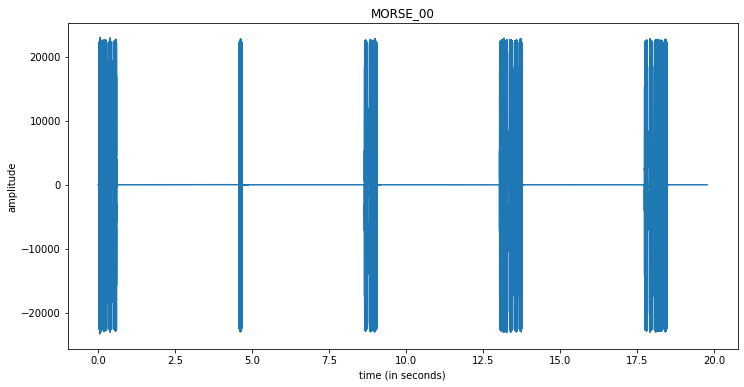

In [10]:
setup_graph(title='MORSE_00', x_label='time (in seconds)', y_label='amplitude', fig_size=(12,6))
plt.plot(time_array, input_signal)
plt.axis('tight')

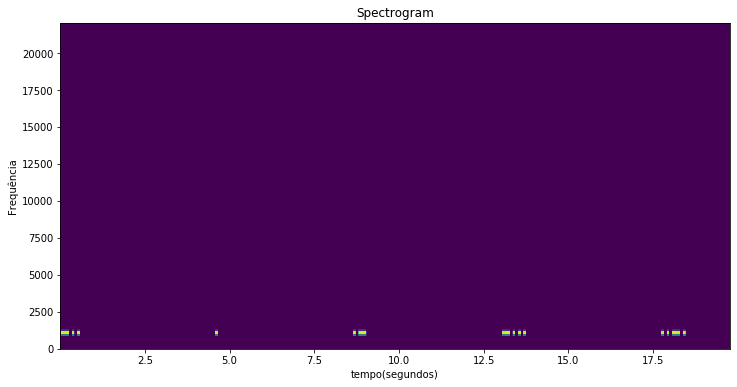

In [11]:
setup_graph(title='Spectrogram', x_label='tempo(segundos)', y_label='Frequência', fig_size=(12,6))

Sxx,freqs, times, im = plt.specgram(input_signal, Fs=sample_rate, scale='linear', NFFT=256)

Que letras estão codificadas na mensagem anterior?

`D E A B F`

Ex: Para cada um dos ficheiros seguintes, ouça o mesmo algumas vezes e tente descodificar a mensagem em código Morse neles contida. Seguidamente crie um espetrograma e confirme visualmente a sua resposta:

In [12]:
Audio('media/MORSE_01.wav') 

In [13]:
(sample_rate, input_signal) = read("media/MORSE_01.wav")

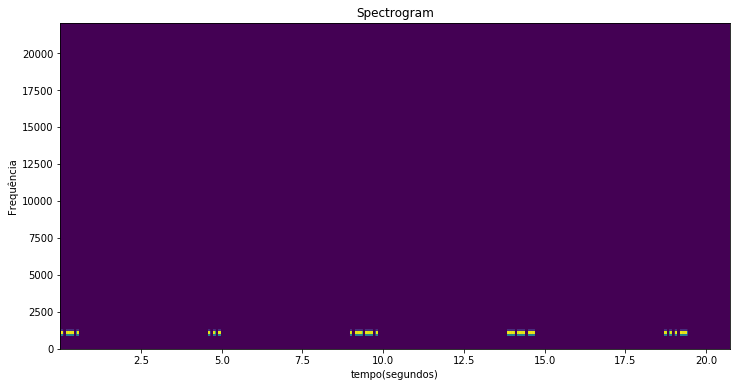

In [14]:
setup_graph(title='Spectrogram', x_label='tempo(segundos)', y_label='Frequência', fig_size=(12,6))
Sxx,freqs, times, im = plt.specgram(input_signal, Fs=sample_rate, scale='linear', NFFT=256)

A mensagem é: `R S P O V`

In [15]:
Audio('media/MORSE_02.wav') 

In [16]:
(sample_rate, input_signal) = read("media/MORSE_02.wav")

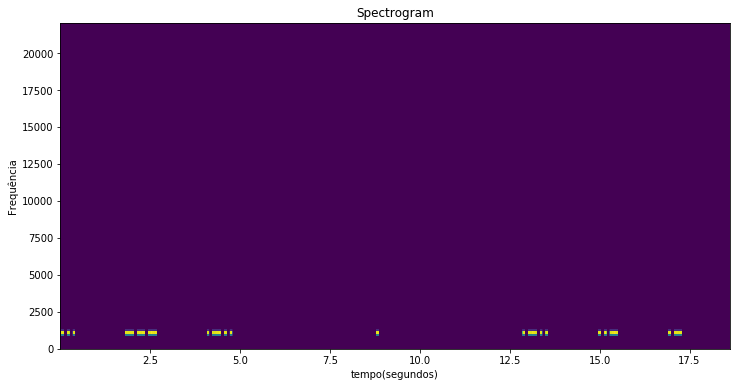

In [17]:
setup_graph(title='Spectrogram', x_label='tempo(segundos)', y_label='Frequência', fig_size=(12,6))
Sxx,freqs, times, im = plt.specgram(input_signal, Fs=sample_rate, scale='linear', NFFT=256)

A mensagem é: `Sol e Lua`

In [18]:
Audio('media/MORSE_03.wav') 

In [19]:
(sample_rate, input_signal) = read("media/MORSE_03.wav")

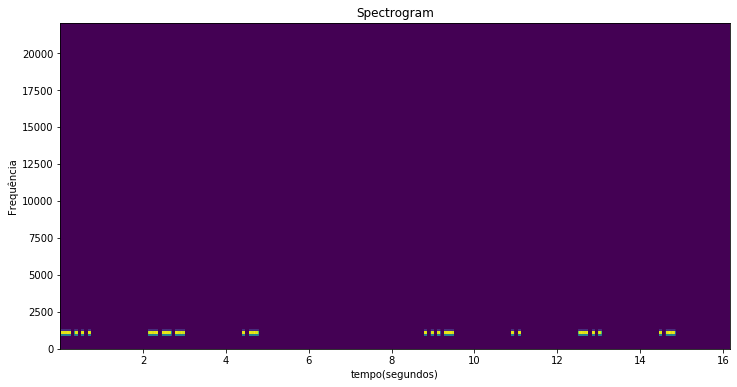

In [20]:
setup_graph(title='Spectrogram', x_label='tempo(segundos)', y_label='Frequência', fig_size=(12,6))
Sxx,freqs, times, im = plt.specgram(input_signal, Fs=sample_rate, scale='linear', NFFT=256)

A mensagem é: `Boa Vida`

In [21]:
Audio('media/MORSE_04.wav') 

In [22]:
(sample_rate, input_signal) = read("media/MORSE_04.wav")

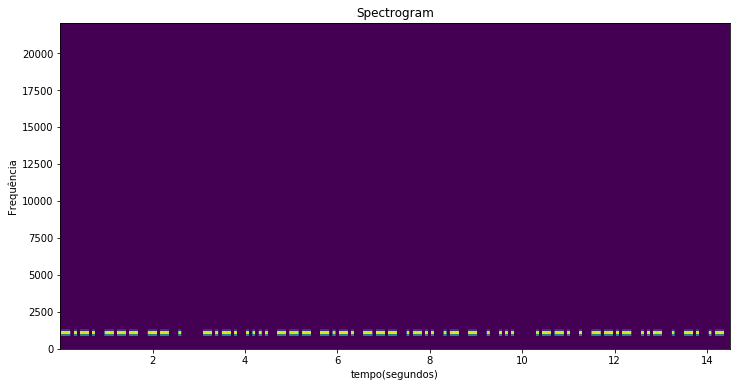

In [23]:
setup_graph(title='Spectrogram', x_label='tempo(segundos)', y_label='Frequência', fig_size=(12,6))
Sxx,freqs, times, im = plt.specgram(input_signal, Fs=sample_rate, scale='linear', NFFT=256)

A mensagem é: `Come chocolates pequena`

# 3. Ouvindo o SAQ
<a id="osaq"></a>

Vamos agora analisar e descodificar algumas gravações de transmissões do SAQ. O início de cada transmissão é realizado do seguinte modo:
* Durante o arranque, enquanto a antena é afinada e outros ajustes são realizados, uma série de sinais internacionais para efeitos de teste são transmitidos, `V's`, juntamente com o indicativo da estação, `SAQ`.
* A transmissão oficial inicia com: `CQ CQ CQ DE SAQ SAQ`, ou `VVV VVV VVV DE SAQ SAQ` repetida uma série de vezes. `CQ` é o sinal para uma chamada geral e `DE` é simplesmente "de" (já que os termos de telecomunicações eram inicialmente dados em francês).
* Seguidamente, a mensagem é transmitida, demorando aproximadamente 10 minutos.

Começemos por uma gravação efetuada no dia das Nações Unidas em 2010:

In [24]:
input_signal, sample_rate = sf.read('media/SAQ24102010.wav')

taxa de amostragem: 48000.0 amostras/segundo
tempo por fft: 0.1707 segundos
resolução por bin  5.86 Hz:


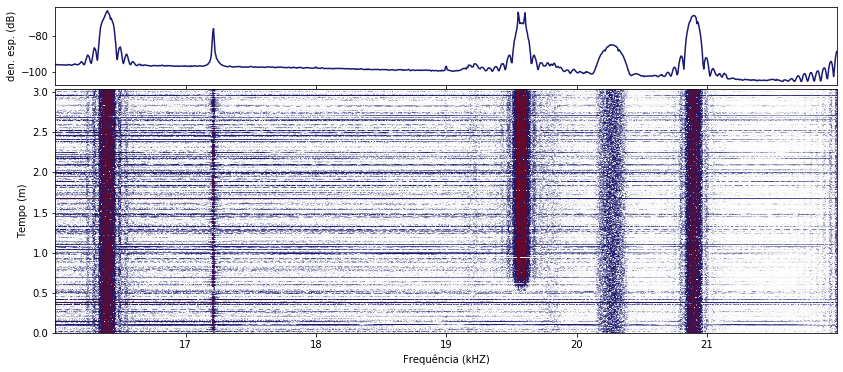

In [25]:
make_spect_plot(input_signal, sample_rate, nptf=8192, overlap=0.5, fmin=16000, fmax=22000)

Como podemos observar, para além dos emissores usuais, temos um pico centrado na frequencia $17.2Khz$ do SAQ. 
Vamos agora selecionar um intervalo de tempo mais pequeno:

taxa de amostragem: 48000.0 amostras/segundo
tempo por fft: 0.0427 segundos
resolução por bin  23.44 Hz:


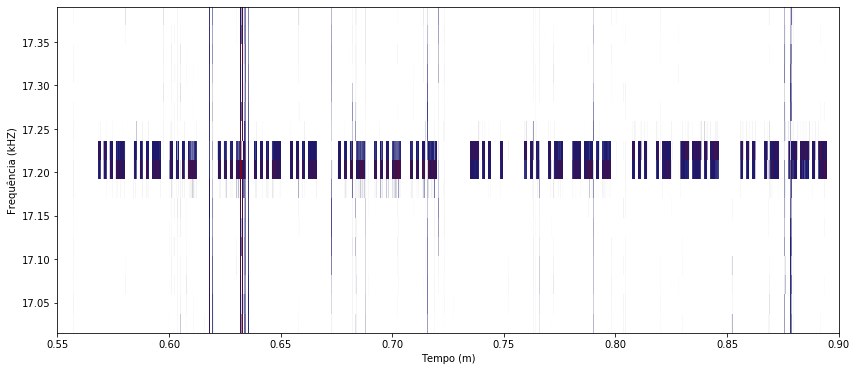

In [26]:
make_spect_plot_H(input_signal, sample_rate, nptf=2048, overlap=0.75, fmin=17000, fmax=17400, tmin=0.55, tmax=0.9)

Prestando atenção, podemos observar o sinal de chamada em Morse `VVV VVV VVV DE SAQ SAQ`, que ocorre antes da mensagem principal.

Na mesma efeméride, no ano de 2015, um excerto da gravação apresenta o seguinte espetografo:

In [27]:
input_signal, sample_rate = sf.read('media/SAQ24102015.wav')

taxa de amostragem: 192000.0 amostras/segundo
tempo por fft: 0.0853 segundos
resolução por bin  11.72 Hz:


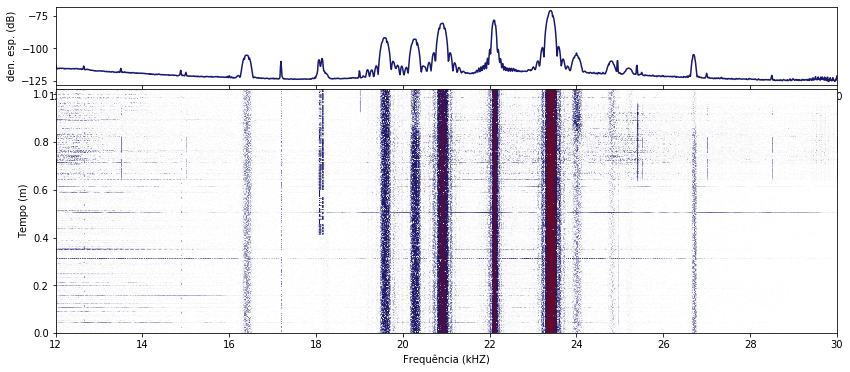

In [28]:
make_spect_plot(input_signal, sample_rate)

O pico na frequência do `SAQ` está presente e ao seu lado, em $18.1kHz$ podemos também observar um tramsnissor militar Russo: o `RDL`.

O `RDL` transmite, para além de informação codificada em modos digitais, mensagens em código Morse, como o nome da estação e chamada. O Morse do `RDL` tem a partucularidade de ser transmitido de forma diferente do `SAQ`. Neste transmissor, o Morse é codificado não por on/off do sinal, mas por mudança de frequência do mesmo. Ora vejamos:

taxa de amostragem: 192000.0 amostras/segundo
tempo por fft: 0.0853 segundos
resolução por bin  11.72 Hz:


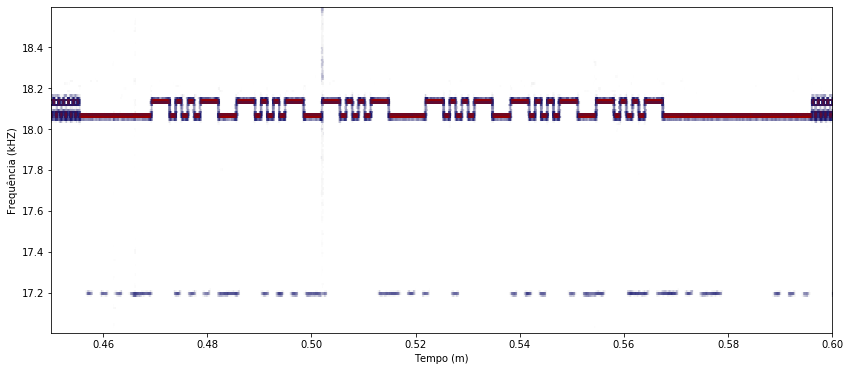

In [29]:
make_spect_plot_H(input_signal, sample_rate, nptf=16384, overlap=0.9, fmin=17000, fmax=18600, tmin=0.45, tmax=0.60)

Ex: Descodifique as mensagens em Morse do `SAQ` e do `RDL`.

`SAQ`: `VVV DE SAQ`  ; `RDL`:  `XXX XXX`

# 4. Explorações

<a id="exp"></a>

### A.

Considere a seguinte gravação:

In [30]:
input_signal, sample_rate = sf.read('media/SAQ30062019.wav')

taxa de amostragem: 192000.0 amostras/segundo
tempo por fft: 0.0853 segundos
resolução por bin  11.72 Hz:


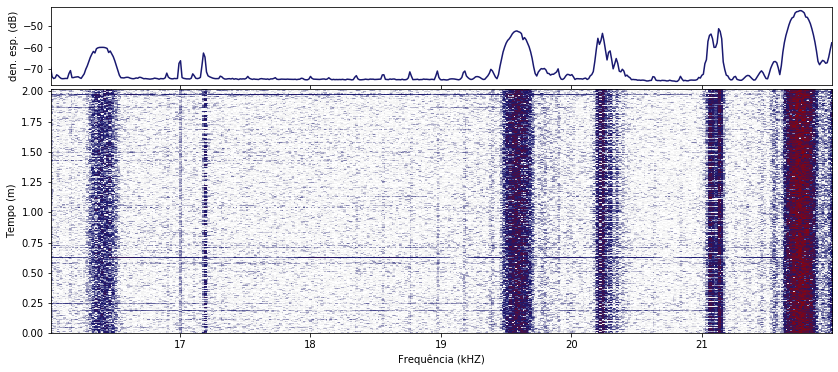

In [31]:
make_spect_plot(input_signal, sample_rate, nptf=16384, overlap=0.5, fmin=16000, fmax=22000)

No excerto seguinte, descodifique a mensagem de Morse nele contida:

taxa de amostragem: 192000.0 amostras/segundo
tempo por fft: 0.0427 segundos
resolução por bin  23.44 Hz:


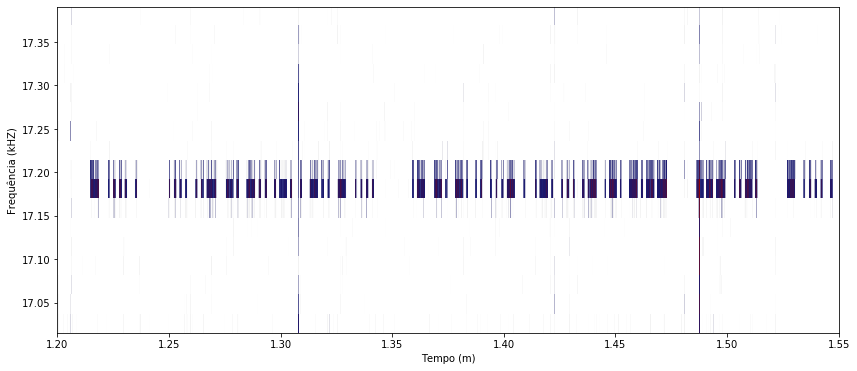

In [32]:
make_spect_plot_H(input_signal, sample_rate, nptf=8192, overlap=0.80, fmin=17000, fmax=17400, tmin=1.20, tmax=1.55)

Mensagem: `THE HUNDREDTH ANAIVERSERY OF THE`

Escolha outros intervalos de tempo e descodifique o excerto de mensagem nele contido.

por exemplo:

taxa de amostragem: 192000.0 amostras/segundo
tempo por fft: 0.0427 segundos
resolução por bin  23.44 Hz:


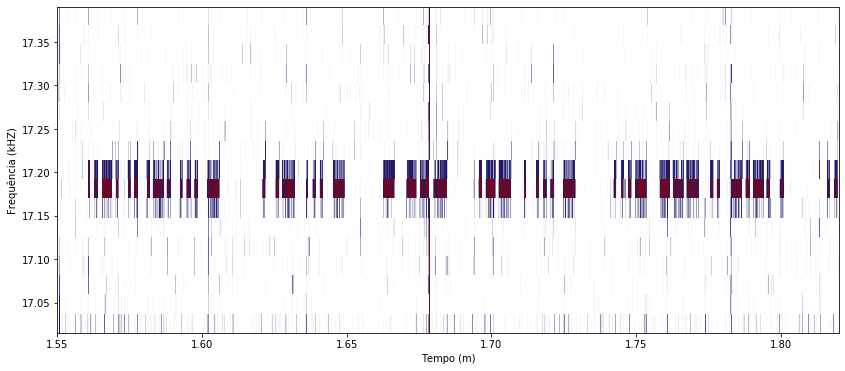

In [34]:
make_spect_plot_H(input_signal, sample_rate, nptf=8192, overlap=0.8, fmin=17000, fmax=17400, tmin=1.55, tmax=1.82)

Mensagem: `FIRST EAST TO WEST VOICE`

### B. 

O transmissor Russo `RDL` emite não só a $18.10Khz$ mas tb a $21.10Khz$. Nos seguintes espetografos conseguimos observar uma dessas transmissões. Analise as mesmas descodificando os excertos de Morse observados.

In [ ]:
input_signal, sample_rate = sf.read('media/RDL30062010.wav')

In [ ]:
make_spect_plot(input_signal, sample_rate, fmin=18000)

In [ ]:
make_spect_plot_H(input_signal, sample_rate, nptf=4096, overlap=0.9, fmin=20800, fmax=21300, tmin=2.02, tmax=2.22)

Morse: `XXX XXX RDL RDL`

In [ ]:
make_spect_plot_H(input_signal, sample_rate, nptf=4096, overlap=0.9, fmin=20800, fmax=21300, tmin=2.42, tmax=2.62)

Morse: `J NANOSNIK BU24`

Depois da sequência em Morse, o trnsmissor inicia uma sequência com uma modulação digital.

In [ ]:
make_spect_plot_H(input_signal, sample_rate, nptf=4096, overlap=0.9, fmin=20800, fmax=21300, tmin=2.62, tmax=2.82)

# 5. Links 

<a id="links"></a>

1. [The Alexander association](https://alexander.n.se/)

2. [Código Morse](https://en.wikipedia.org/wiki/Morse_code)

3. [Construção de recetores rádio como introdução à Física das Telecomunicações - parte I ](https://www.spf.pt/magazines/GFIS/113/913)

4. [Construção de recetores rádio como introdução à Física das Telecomunicações - parte II ](https://www.spf.pt/magazines/GFIS/114/931)

5. [Ouvindo o emissor SAQ de Grimeton ](https://www.spf.pt/magazines/GFIS/118/969)